In [20]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.graph_objects as go


from prophet import Prophet
from sklearn.metrics import r2_score

In [21]:
df0 = pd.read_csv("country_wise_latest.csv")
df1 = pd.read_csv("covid_19_clean_complete.csv")
df2 = pd.read_csv("day_wise.csv")
df3 = pd.read_csv("full_grouped.csv")
df4 = pd.read_csv("usa_county_wise.csv")
df5 = pd.read_csv("worldometer_data.csv")

C:\Users\Saumitra\AppData\Local\Temp\ipykernel_11396\206692647.py:14: DeprecationWarning:

The library used by the *country names* `locationmode` option is changing in an upcoming version. Country names in existing plots may not work in the new version. To ensure consistent behavior, consider setting `locationmode` to *ISO-3*.



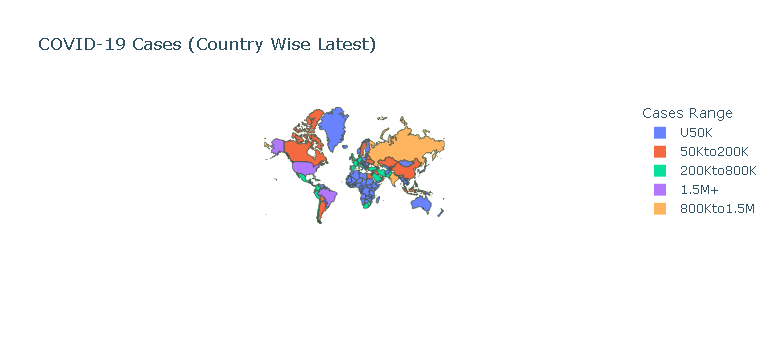

In [22]:
df0 = pd.read_csv("country_wise_latest.csv")

world = df0[["Country/Region", "Confirmed"]].copy()
world.columns = ["Country", "Cases"]

world["Country"] = world["Country"].str.upper()

world["Cases Range"] = pd.cut(
    world["Cases"],
    [-1, 50000, 200000, 800000, 1500000, 1e9],
    labels=["U50K", "50Kto200K", "200Kto800K", "800Kto1.5M", "1.5M+"]
)

fig = px.choropleth(
    world,
    locations="Country",
    locationmode="country names",
    color="Cases Range",
    projection="mercator",
    title="COVID-19 Cases (Country Wise Latest)"
)

fig.update_geos(visible=False)
fig.show()


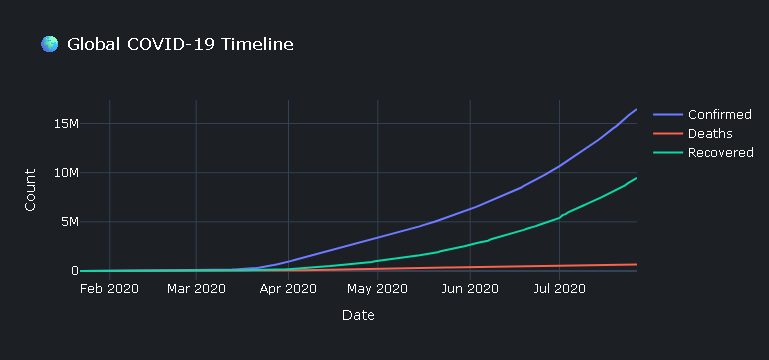

In [23]:
fig = go.Figure()

fig.add_trace(go.Scatter(
    x=df2["Date"], y=df2["Confirmed"],
    mode="lines", name="Confirmed"
))

fig.add_trace(go.Scatter(
    x=df2["Date"], y=df2["Deaths"],
    mode="lines", name="Deaths"
))

fig.add_trace(go.Scatter(
    x=df2["Date"], y=df2["Recovered"],
    mode="lines", name="Recovered"
))

fig.update_layout(
    title="🌍 Global COVID-19 Timeline",
    template="plotly_dark",
    xaxis_title="Date",
    yaxis_title="Count"
)

fig.show()


C:\Users\Saumitra\AppData\Local\Temp\ipykernel_11396\1519202332.py:17: DeprecationWarning:

The library used by the *country names* `locationmode` option is changing in an upcoming version. Country names in existing plots may not work in the new version. To ensure consistent behavior, consider setting `locationmode` to *ISO-3*.



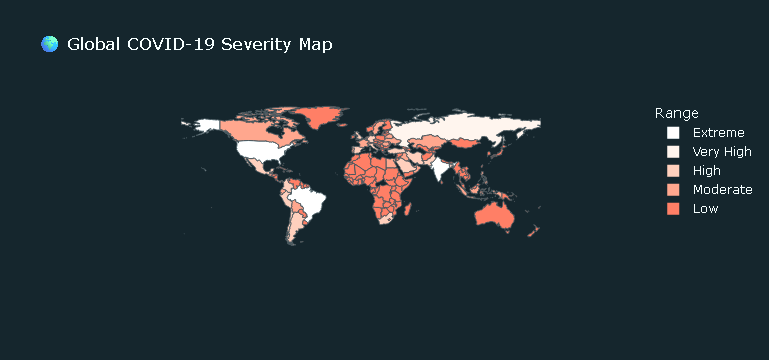

In [24]:
world = df5[["Country/Region","TotalCases"]].copy()
world.columns = ["Country","Cases"]

world["Cases"] = (
    world["Cases"].astype(str)
    .str.replace(",", "")
    .replace("nan", np.nan)
    .astype(float)
)

world["Range"] = pd.cut(
    world["Cases"],
    [-1,5e4,2e5,8e5,1.5e6,1e9],
    labels=["Low","Moderate","High","Very High","Extreme"]
)

fig = px.choropleth(
    world,
    locations="Country",
    locationmode="country names",
    color="Range",
    color_discrete_sequence=px.colors.sequential.Reds,
    title="🌍 Global COVID-19 Severity Map",
    template="plotly_dark"
)

fig.update_geos(visible=False)
fig.show()


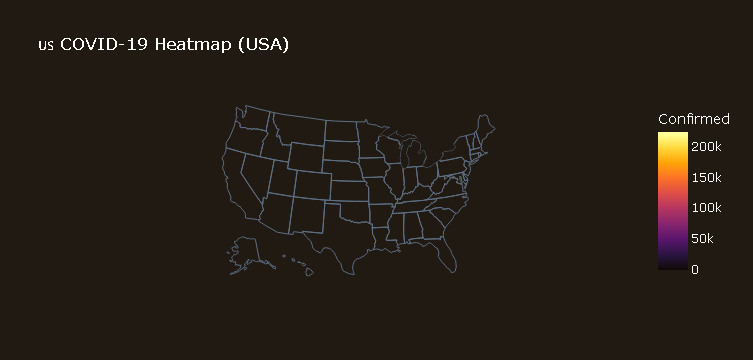

In [25]:
fig = px.choropleth(
    df4,
    locations="Province_State",
    locationmode="USA-states",
    color="Confirmed",
    scope="usa",
    color_continuous_scale="Inferno",
    title="🇺🇸 COVID-19 Heatmap (USA)",
    template="plotly_dark"
)

fig.show()


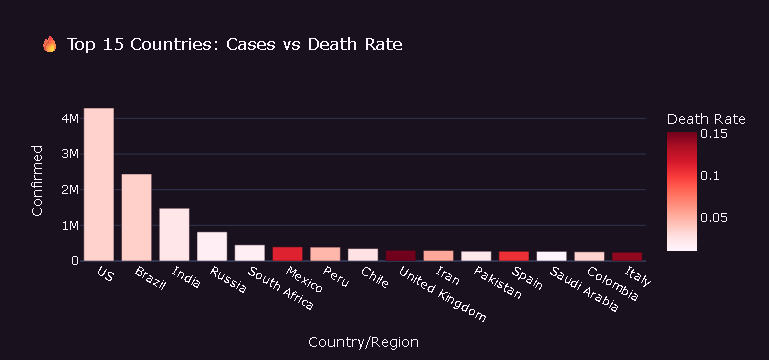

In [26]:
df0["Death Rate"] = df0["Deaths"] / df0["Confirmed"]

top = df0.sort_values("Confirmed", ascending=False).head(15)

fig = px.bar(
    top,
    x="Country/Region",
    y="Confirmed",
    color="Death Rate",
    color_continuous_scale="Reds",
    title="🔥 Top 15 Countries: Cases vs Death Rate",
    template="plotly_dark"
)

fig.show()


C:\Users\Saumitra\AppData\Local\Temp\ipykernel_11396\1449107455.py:3: DeprecationWarning:

The library used by the *country names* `locationmode` option is changing in an upcoming version. Country names in existing plots may not work in the new version. To ensure consistent behavior, consider setting `locationmode` to *ISO-3*.



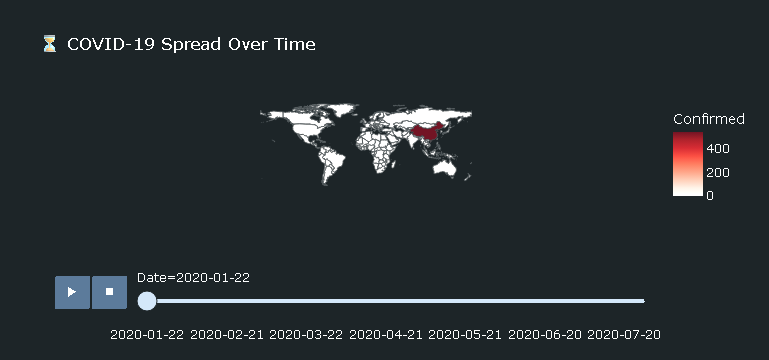

In [27]:
df3["Date"] = pd.to_datetime(df3["Date"])

fig = px.choropleth(
    df3,
    locations="Country/Region",
    locationmode="country names",
    color="Confirmed",
    animation_frame=df3["Date"].dt.strftime("%Y-%m-%d"),
    color_continuous_scale="Reds",
    title="⏳ COVID-19 Spread Over Time",
    template="plotly_dark"
)

fig.update_geos(visible=False)
fig.show()


18:55:39 - cmdstanpy - INFO - Chain [1] start processing
18:55:40 - cmdstanpy - INFO - Chain [1] done processing


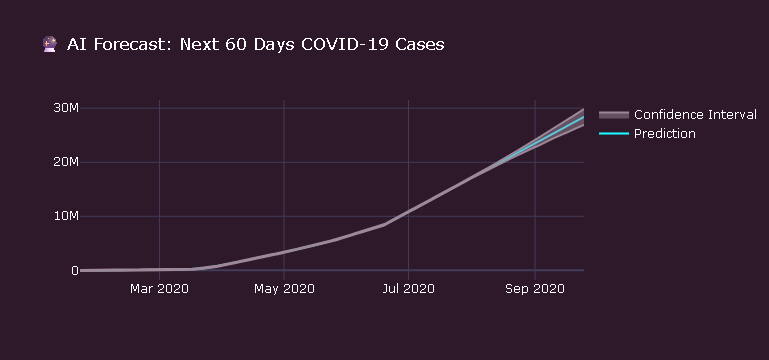

In [28]:
cases = df1.groupby("Date")["Confirmed"].sum().reset_index()
cases["Date"] = pd.to_datetime(cases["Date"])

df_fb = pd.DataFrame({
    "ds": cases["Date"],
    "y": cases["Confirmed"]
})

model = Prophet(weekly_seasonality=True)
model.fit(df_fb)

future = model.make_future_dataframe(periods=60)
forecast = model.predict(future)

fig = go.Figure()

fig.add_trace(go.Scatter(
    x=forecast["ds"], y=forecast["yhat"],
    name="Prediction", line=dict(color="cyan")
))

fig.add_trace(go.Scatter(
    x=forecast["ds"],
    y=forecast["yhat_upper"],
    fill=None, mode="lines",
    line=dict(color="gray"),
    showlegend=False
))

fig.add_trace(go.Scatter(
    x=forecast["ds"],
    y=forecast["yhat_lower"],
    fill="tonexty",
    mode="lines",
    line=dict(color="gray"),
    name="Confidence Interval"
))

fig.update_layout(
    title="🔮 AI Forecast: Next 60 Days COVID-19 Cases",
    template="plotly_dark"
)

fig.show()
